huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

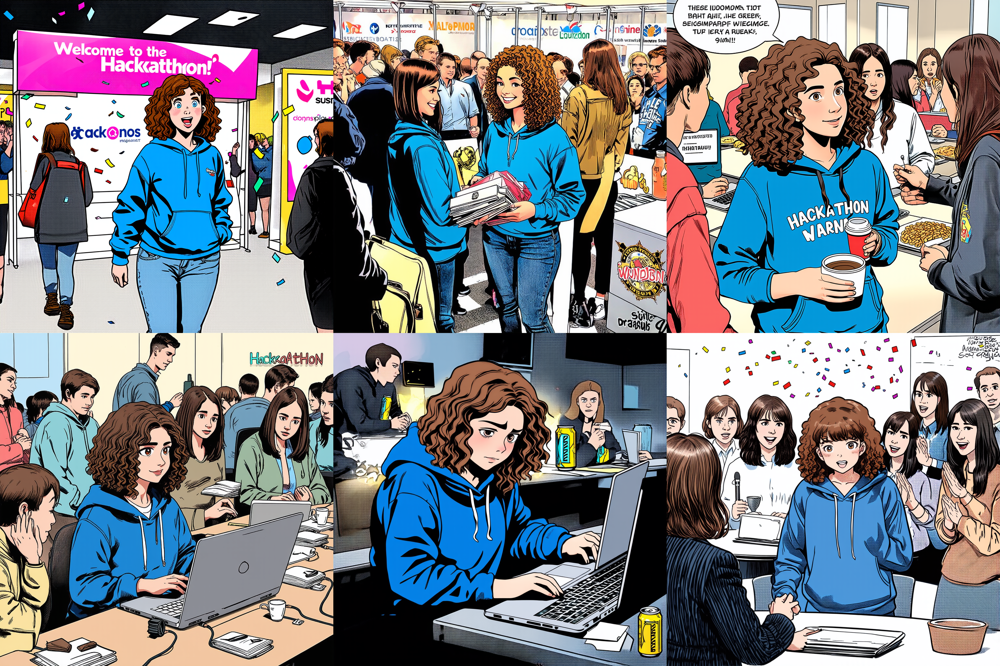

In [5]:
# Install necessary libraries
!pip install torch diffusers transformers accelerate matplotlib pillow

# Import libraries
from diffusers import DiffusionPipeline
import torch
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load the Stable Diffusion model from the specified pipeline
pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-3-medium-diffusers",
    torch_dtype=torch.float16
)
pipeline.enable_sequential_cpu_offload()  # Enables efficient memory use for GPU with lower VRAM

# Create a directory to store individual images temporarily
output_dir = "temp_panels"
os.makedirs(output_dir, exist_ok=True)

# Define prompts for each panel with consistent character appearance
prompts = [
    "Comic style illustration: A young woman with shoulder-length curly brown hair, wearing a blue hoodie and jeans, arrives at a lively hackathon event. She looks excited and wide-eyed, standing in front of a large 'Welcome to the Hackathon!' banner. Sponsors’ booths are set up with colorful signs, and confetti is flying around, creating an energetic atmosphere.",
    "Comic style illustration: The young woman with shoulder-length curly brown hair, in her blue hoodie and jeans, chats enthusiastically with a sponsor at a crowded booth. She’s holding a stack of swag with a big smile, surrounded by sponsors and other attendees. The scene is lively with colorful sponsor logos in the background.",
    "Comic style illustration: The young woman with curly brown hair, wearing a blue hoodie, explores the hackathon venue with a group of friends. She holds a cup of coffee and looks around with excitement. The background features other participants working and grabbing snacks, with a welcoming, energetic atmosphere.",
    "Comic style illustration: The young woman with shoulder-length curly brown hair and a blue hoodie is working intensely on her laptop, surrounded by teammates in the hackathon room. Her face shows deep concentration, and she’s surrounded by notebooks, coffee cups, and power cables. The scene is filled with passionate, focused participants.",
    "Comic style illustration: The young woman with curly brown hair, wearing her blue hoodie, sits with tired eyes and a determined expression as the hackathon stretches into the night. She leans over her laptop, surrounded by energy drink cans and a glowing clock showing the late hour. Other participants look similarly tired but focused.",
    "Comic style illustration: The young woman with shoulder-length curly brown hair and blue hoodie presents her team’s project in front of a panel of judges, looking both exhausted and proud. Her teammates stand beside her, smiling as confetti falls and the audience applauds. The background has judges at a table, and the scene captures a victorious moment."
]





# Generate and save each panel as individual images
images = []
for i, prompt in enumerate(prompts):
    # Generate an image based on the prompt
    image = pipeline(prompt).images[0]
    
    # Save each image temporarily as PNG
    image_path = os.path.join(output_dir, f"panel_{i+1}.png")
    image.save(image_path, format="PNG")
    
    # Append image to the list for later use in the collage
    images.append(image)

# Step 1: Set up the dimensions for the collage
# Assuming a 2x3 grid (2 rows and 3 columns)
collage_width = images[0].width * 3  # Width of 3 images side by side
collage_height = images[0].height * 2  # Height of 2 images stacked

# Create a blank canvas for the collage
collage_image = Image.new('RGB', (collage_width, collage_height))

# Step 2: Arrange the images in the collage
for i, img in enumerate(images):
    x = (i % 3) * img.width  # X position in the collage (3 images per row)
    y = (i // 3) * img.height  # Y position in the collage (2 rows)
    collage_image.paste(img, (x, y))

# Step 3: Save the final collage as a single PNG file
collage_image.save("hackathon_comic_strip_collage.png", format="PNG")

# Display the final collage
collage_image.show()
